# Import Libraries and Dataset

In [3]:
import pandas as pd
import numpy as np

# Data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Data preprocessing
from sklearn.impute import KNNImputer
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, MaxAbsScaler, StandardScaler

# Classifier
from sklearn.naive_bayes import MultinomialNB, GaussianNB, BernoulliNB
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier, AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier
from sklearn.svm import SVC

# Model Evaluation
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, fbeta_score, roc_auc_score, precision_recall_curve

# Feature Selection
from scipy.stats import f_oneway
from scipy.stats import chi2_contingency

# Pickle
import pickle

# Warning
import warnings
warnings.filterwarnings('ignore')

In [4]:
df = pd.read_csv('ds_project4_customer_churn_data.csv')
df

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,...,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.5,No
7039,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.9,No
7040,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.6,Yes


In [5]:
df.drop(columns='customerID', inplace=True)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            7043 non-null   object 
 1   SeniorCitizen     7043 non-null   int64  
 2   Partner           7043 non-null   object 
 3   Dependents        7043 non-null   object 
 4   tenure            7043 non-null   int64  
 5   PhoneService      7043 non-null   object 
 6   MultipleLines     7043 non-null   object 
 7   InternetService   7043 non-null   object 
 8   OnlineSecurity    7043 non-null   object 
 9   OnlineBackup      7043 non-null   object 
 10  DeviceProtection  7043 non-null   object 
 11  TechSupport       7043 non-null   object 
 12  StreamingTV       7043 non-null   object 
 13  StreamingMovies   7043 non-null   object 
 14  Contract          7043 non-null   object 
 15  PaperlessBilling  7043 non-null   object 
 16  PaymentMethod     7043 non-null   object 


In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
SeniorCitizen,7043.0,0.162147,0.368612,0.00,0.0,0.00,0.00,1.00
tenure,7043.0,32.371149,24.559481,0.00,9.0,29.00,55.00,72.00
MonthlyCharges,7043.0,64.761692,30.090047,18.25,35.5,70.35,89.85,118.75


# Fix the TotalCharges Column

In [9]:
df['TotalCharges'] = pd.to_numeric(df['TotalCharges'], errors='coerce')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            7043 non-null   object 
 1   SeniorCitizen     7043 non-null   int64  
 2   Partner           7043 non-null   object 
 3   Dependents        7043 non-null   object 
 4   tenure            7043 non-null   int64  
 5   PhoneService      7043 non-null   object 
 6   MultipleLines     7043 non-null   object 
 7   InternetService   7043 non-null   object 
 8   OnlineSecurity    7043 non-null   object 
 9   OnlineBackup      7043 non-null   object 
 10  DeviceProtection  7043 non-null   object 
 11  TechSupport       7043 non-null   object 
 12  StreamingTV       7043 non-null   object 
 13  StreamingMovies   7043 non-null   object 
 14  Contract          7043 non-null   object 
 15  PaperlessBilling  7043 non-null   object 
 16  PaymentMethod     7043 non-null   object 


In [10]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
SeniorCitizen,7043.0,0.162147,0.368612,0.00,0.00,0.000,0.0000,1.00
tenure,7043.0,32.371149,24.559481,0.00,9.00,29.000,55.0000,72.00
MonthlyCharges,7043.0,64.761692,30.090047,18.25,35.50,70.350,89.8500,118.75
TotalCharges,7032.0,2283.300441,2266.771362,18.80,401.45,1397.475,3794.7375,8684.80


# Exploratory Data Analysis (EDA)

## Distribution of Each Column

### Numerical Columns

In [14]:
num_col = df.select_dtypes(include=np.number).columns
num_col

Index(['SeniorCitizen', 'tenure', 'MonthlyCharges', 'TotalCharges'], dtype='object')

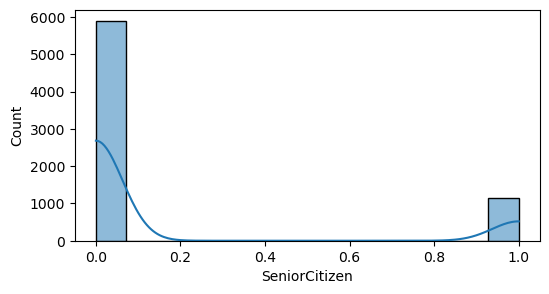

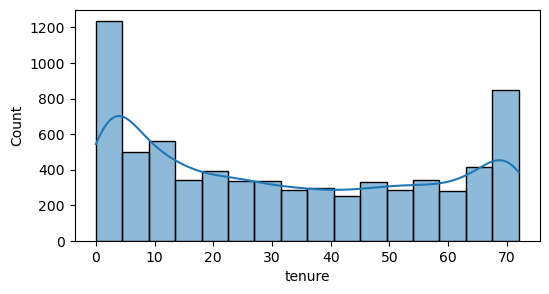

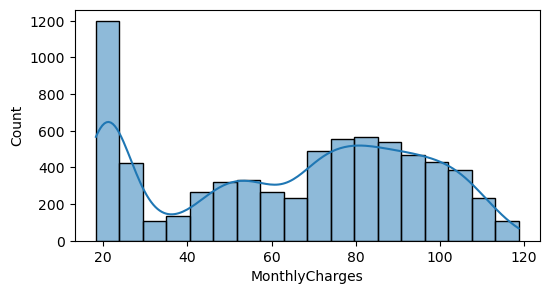

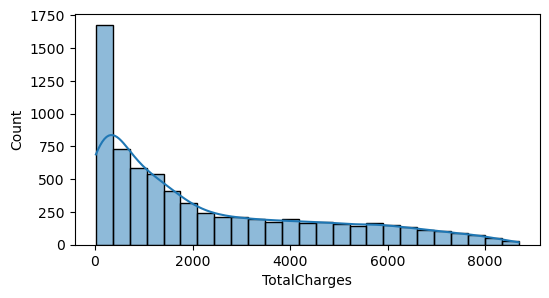

In [15]:
for num in num_col:
    plt.figure(figsize = (6,3))
    sns.histplot(data = df[num], kde = True)
    plt.show()

### Categorical Columns

In [17]:
cat_col = df.select_dtypes(include='object').columns
cat_col

Index(['gender', 'Partner', 'Dependents', 'PhoneService', 'MultipleLines',
       'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
       'TechSupport', 'StreamingTV', 'StreamingMovies', 'Contract',
       'PaperlessBilling', 'PaymentMethod', 'Churn'],
      dtype='object')

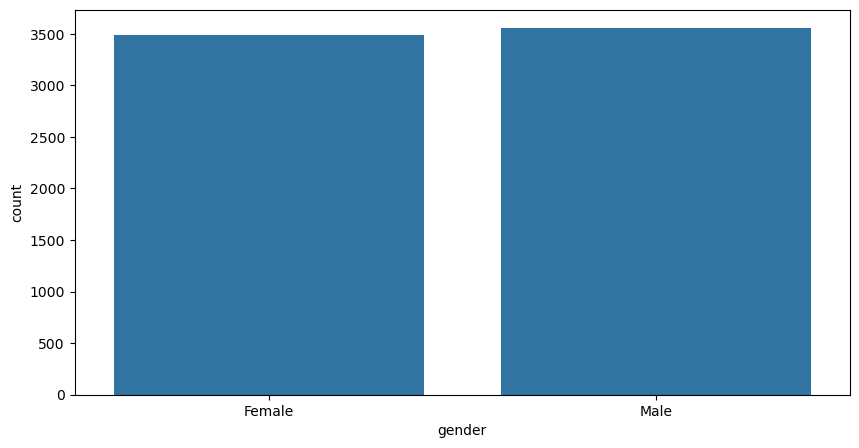

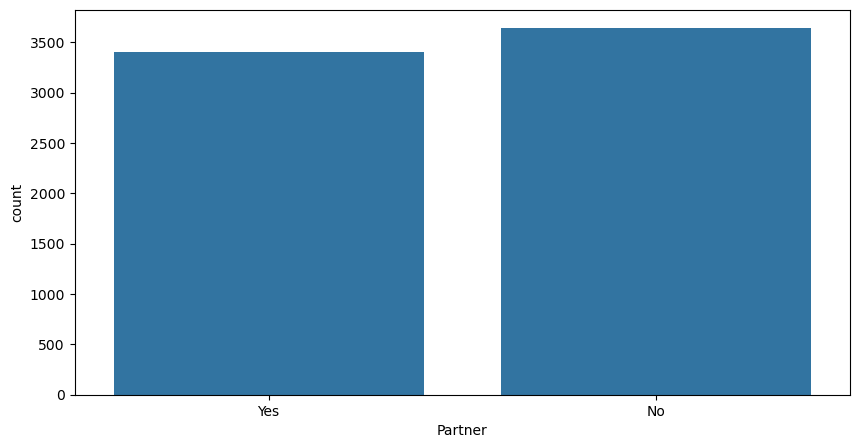

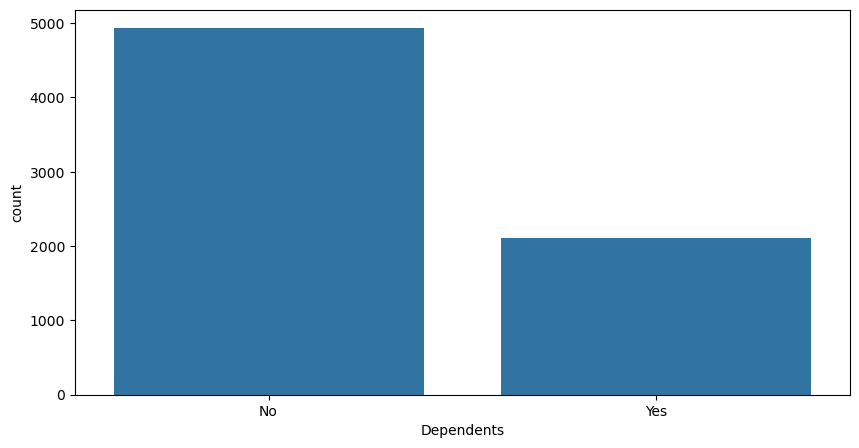

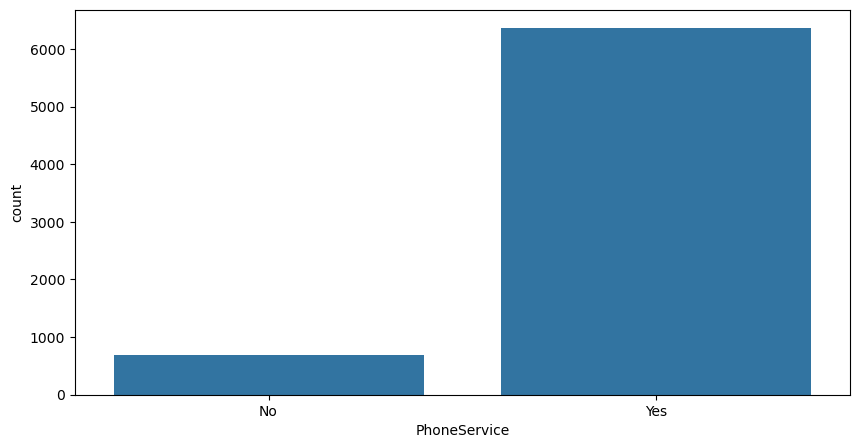

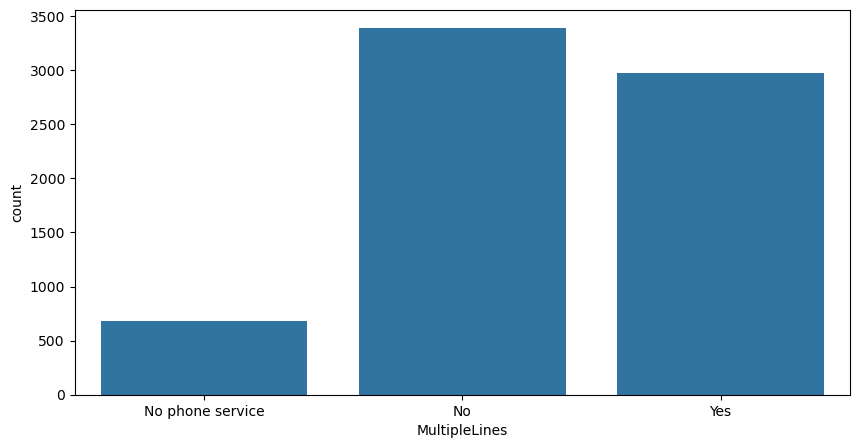

...

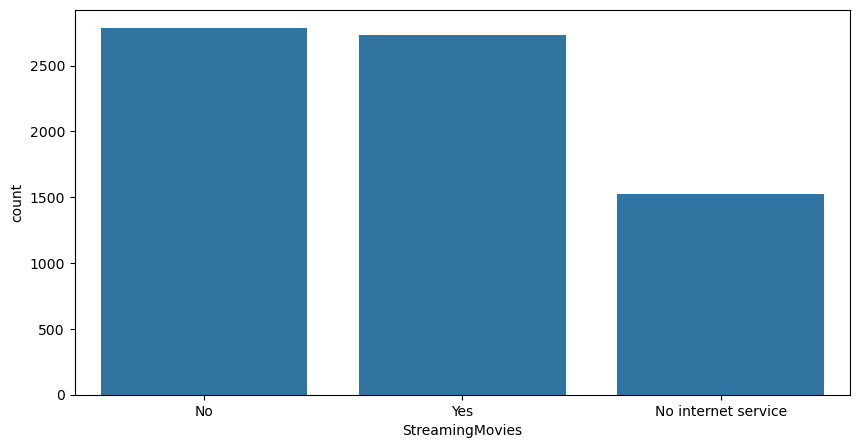

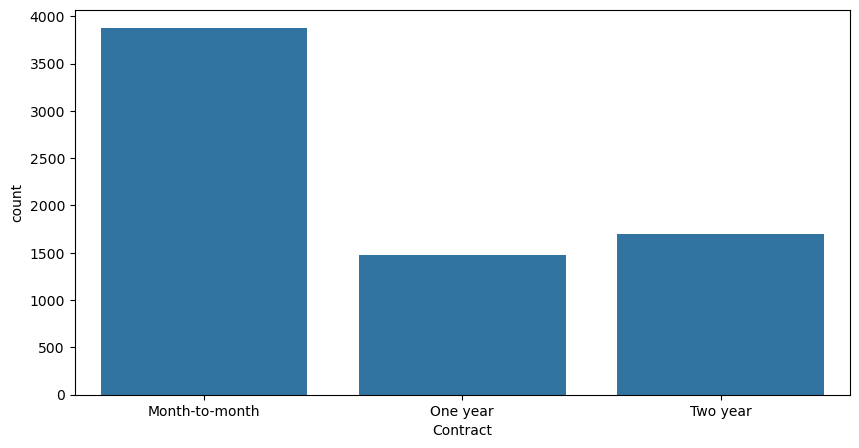

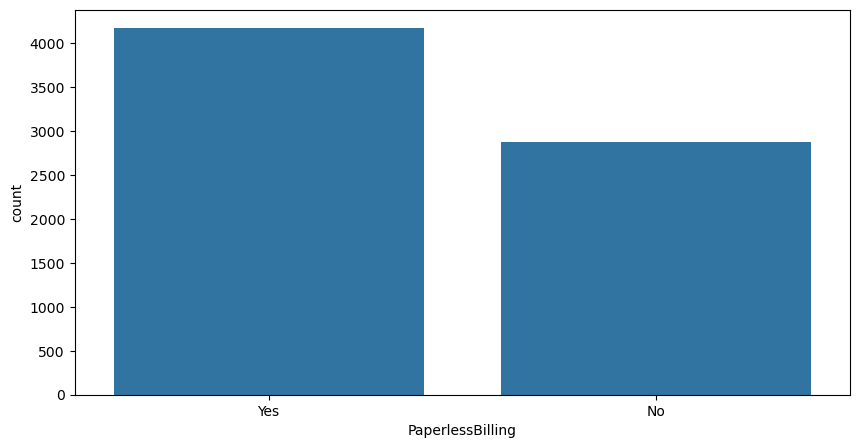

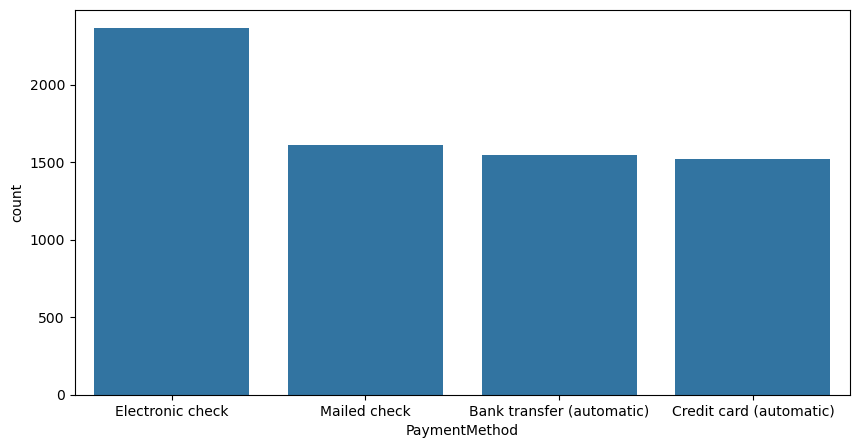

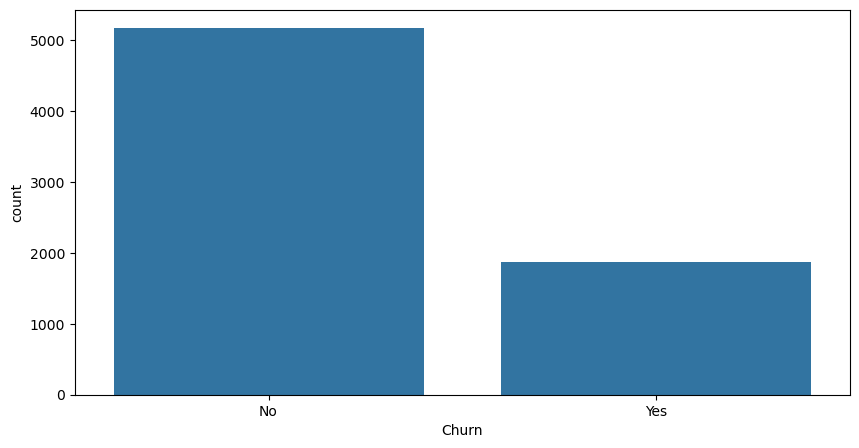

In [18]:
for cat in cat_col:
    plt.figure(figsize = (10,5))
    sns.countplot(data = df, x = cat)
    plt.show()

## Bivariate Analysis

### Between Numerical Columns

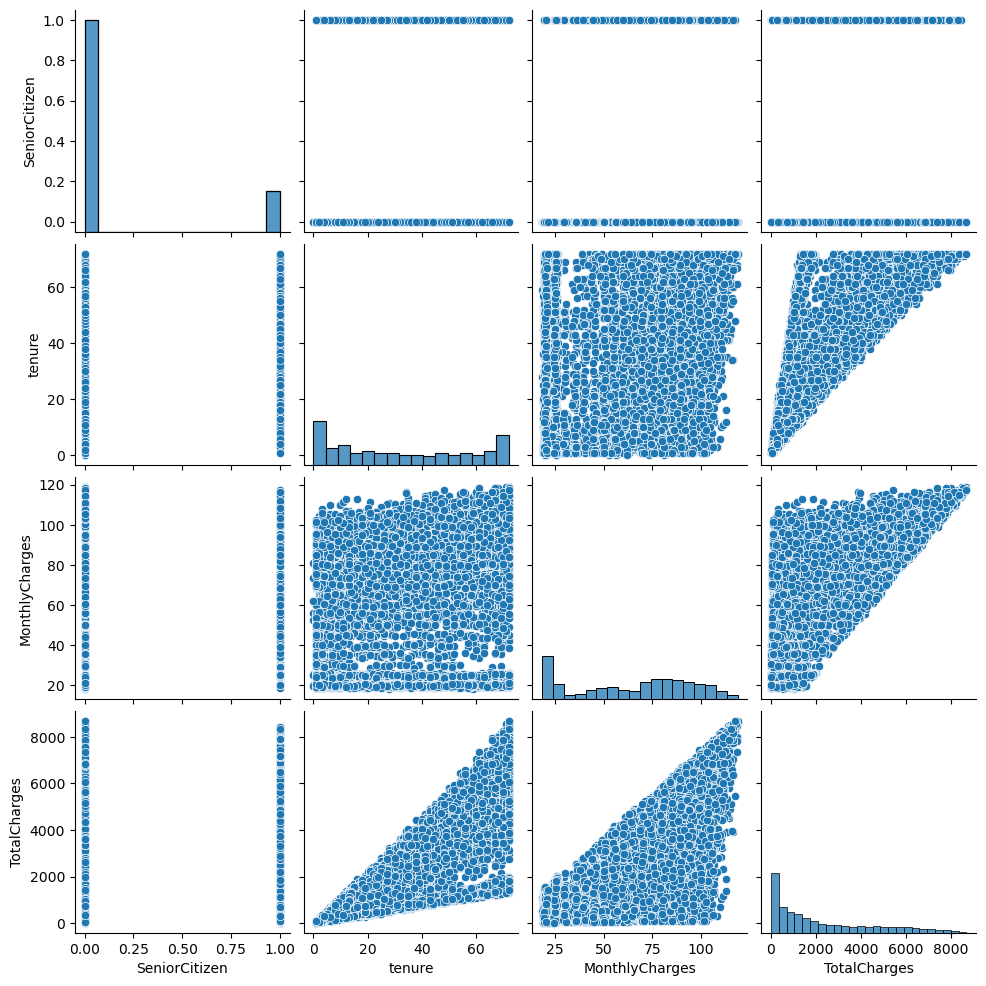

In [21]:
sns.pairplot(df)
plt.show()

### Between Categorical Columns

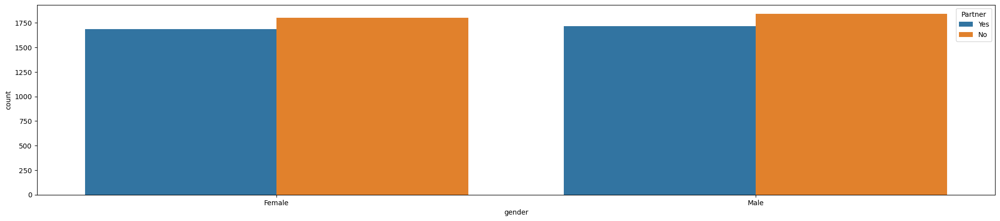

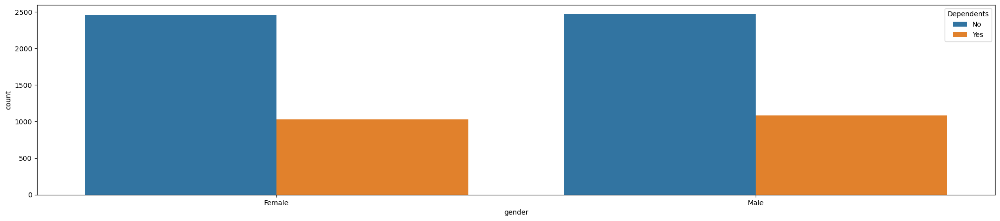

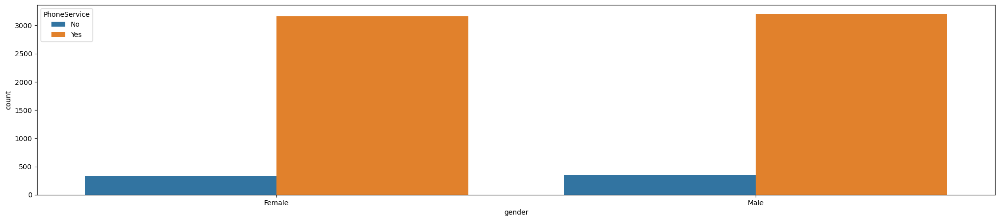

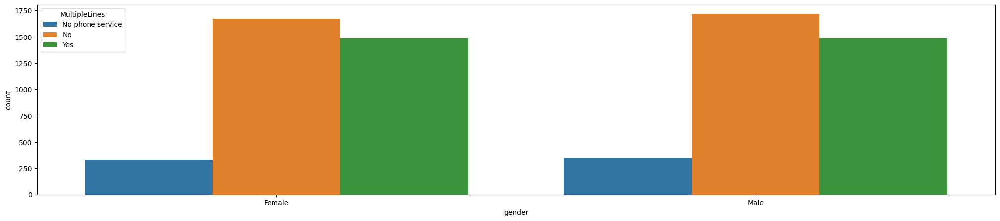

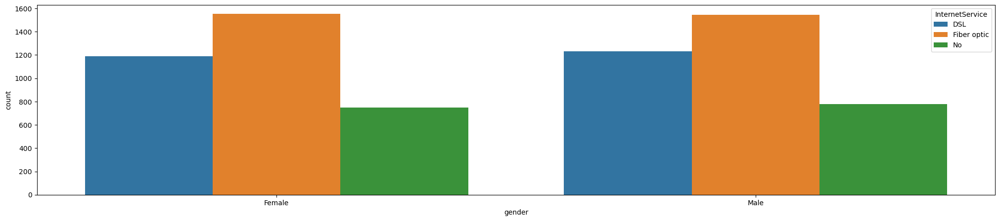

...

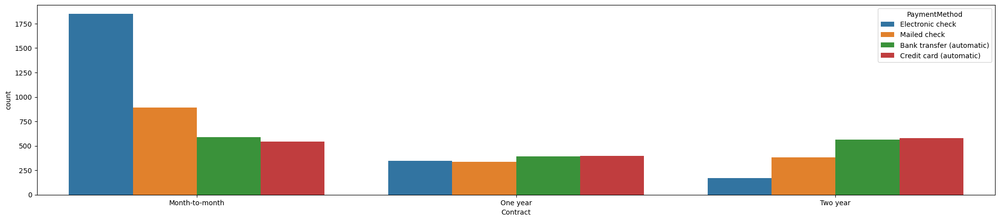

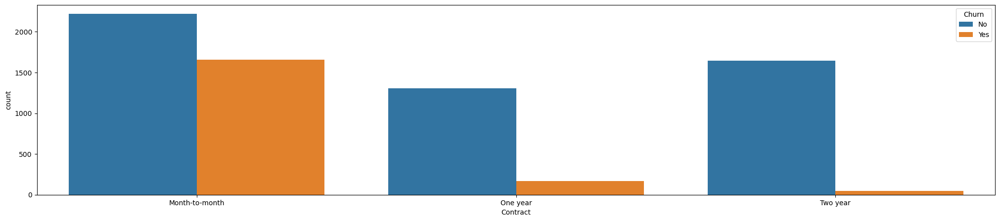

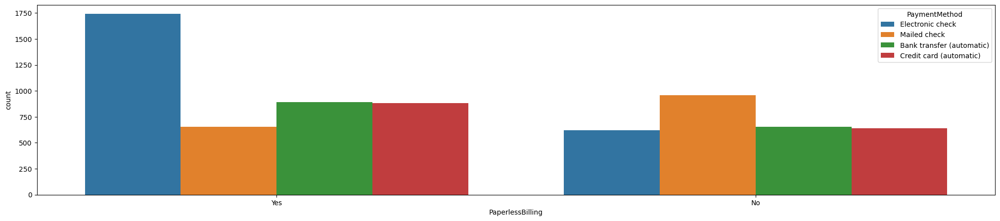

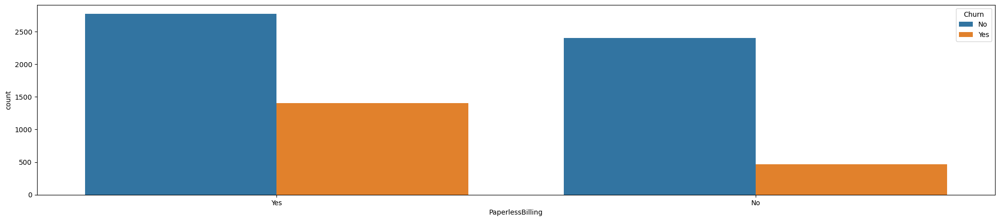

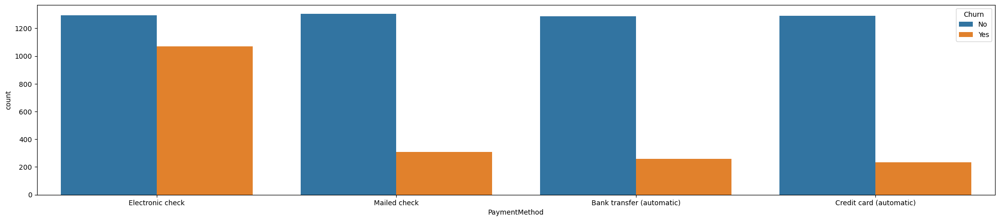

In [23]:
for i in range(len(cat_col)):
    for j in range(len(cat_col)):
        category1 = cat_col[i]
        category2 = cat_col[j]

        if i < j:
            plt.figure(figsize = (25,5))
            sns.countplot(data = df, x = category1, hue = category2, legend='auto')
            plt.show()

### Numerical and Categorical Column

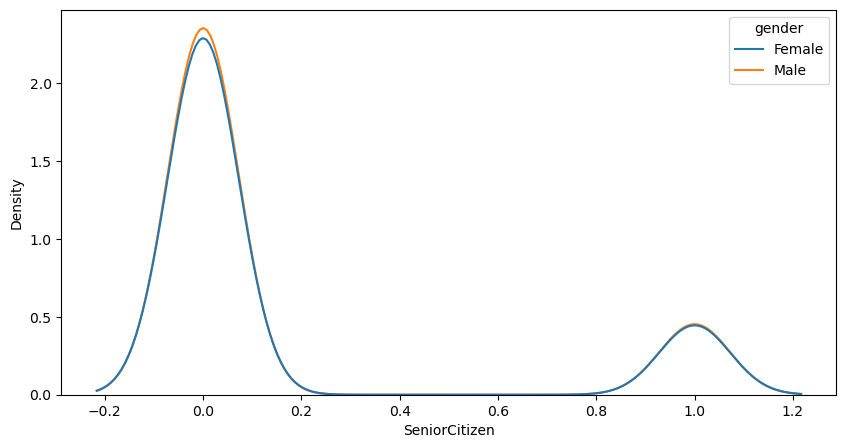

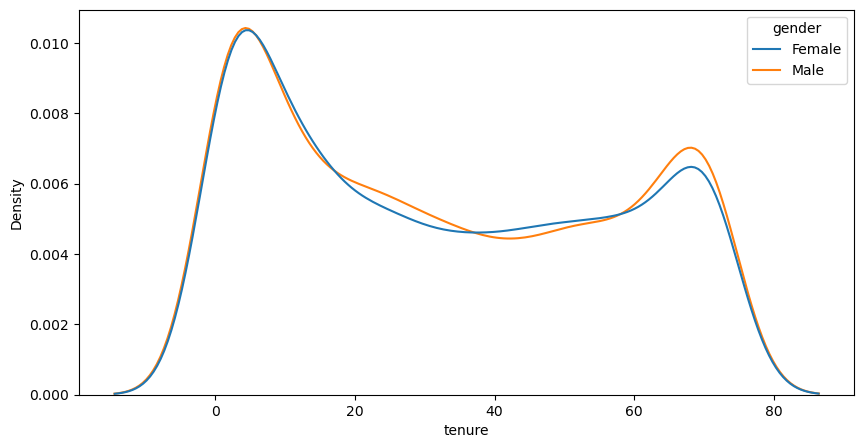

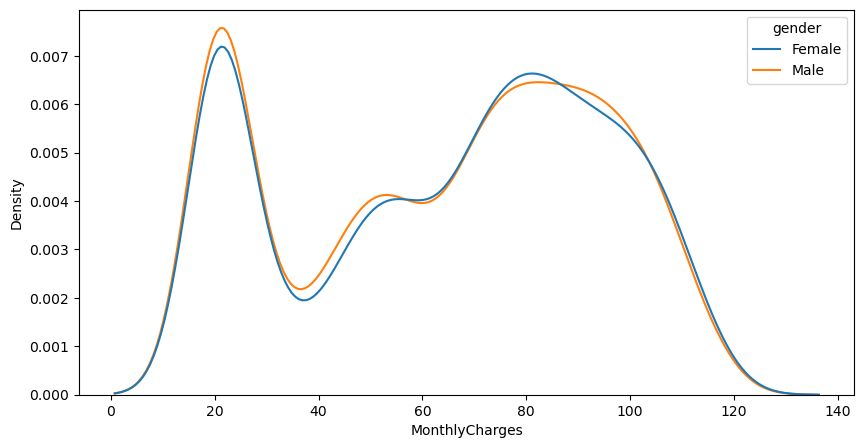

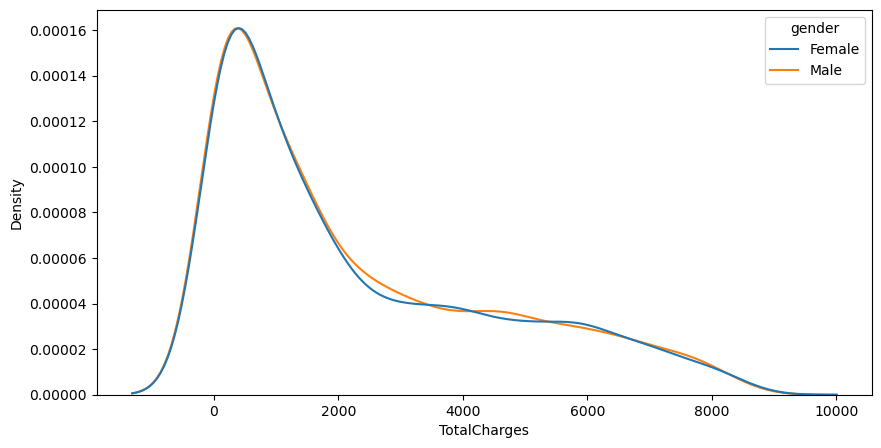

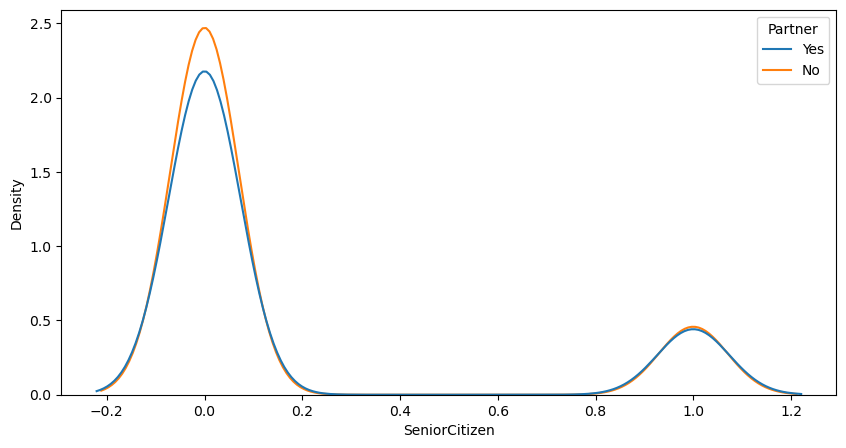

...

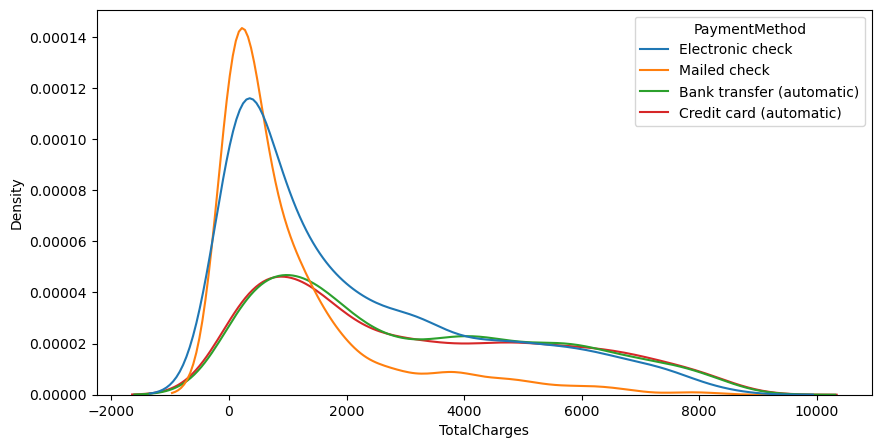

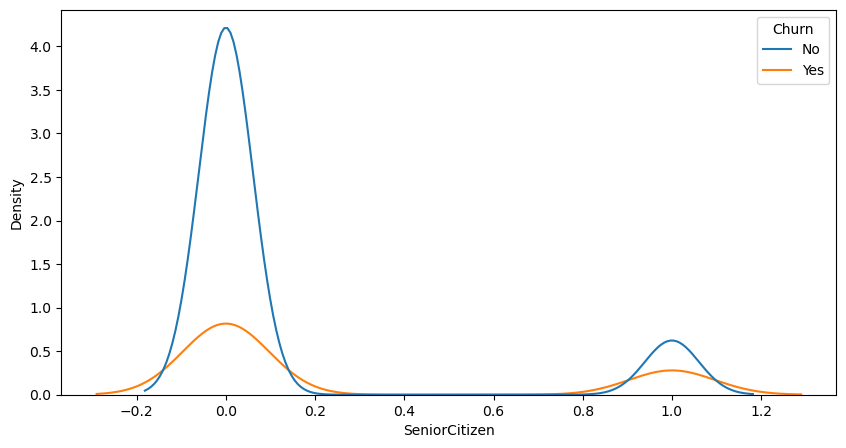

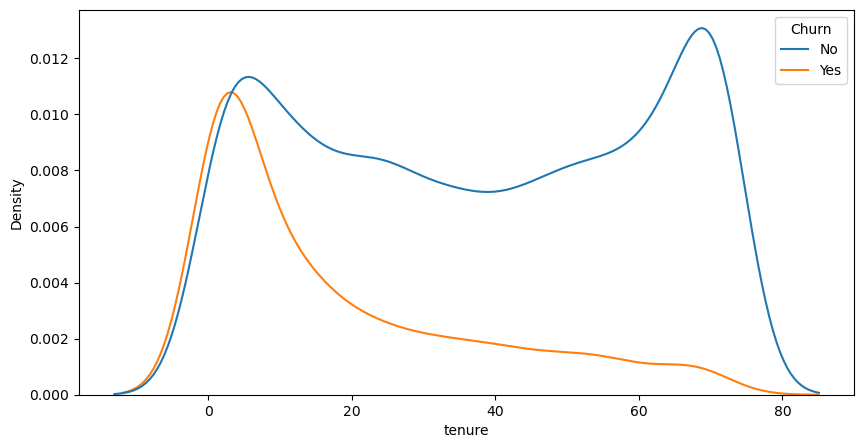

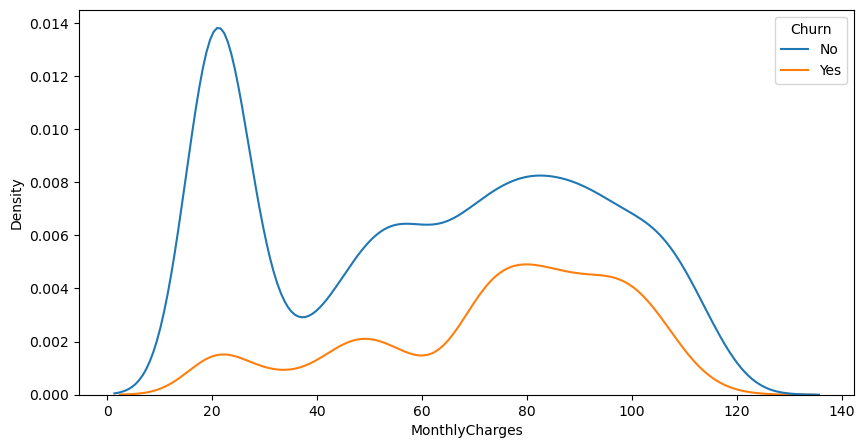

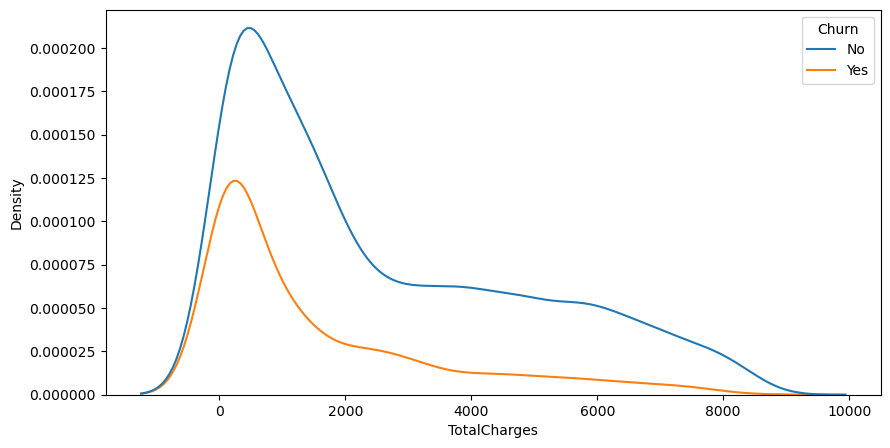

In [25]:
for cat in cat_col:
    for num in num_col:
        plt.figure(figsize = (10, 5))
        sns.kdeplot(data = df, x = num, hue = cat)
        plt.show()

## Multivariate Analysis

In [27]:
def bivariate_scatter(x, y, hue, df):
    plt.figure(figsize = (10,5))
    sns.scatterplot(x = x, y = y, data = df, hue = hue, alpha = 0.85)

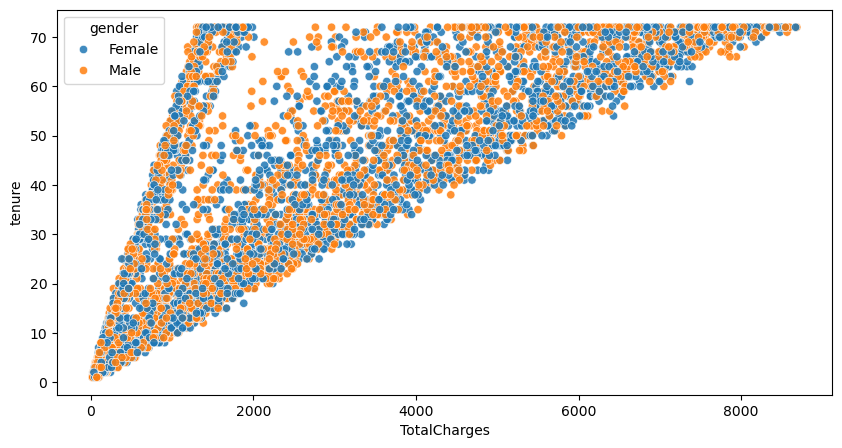

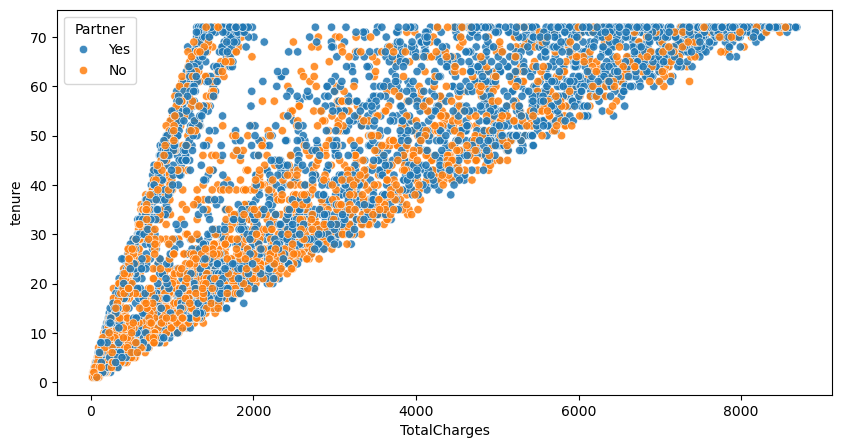

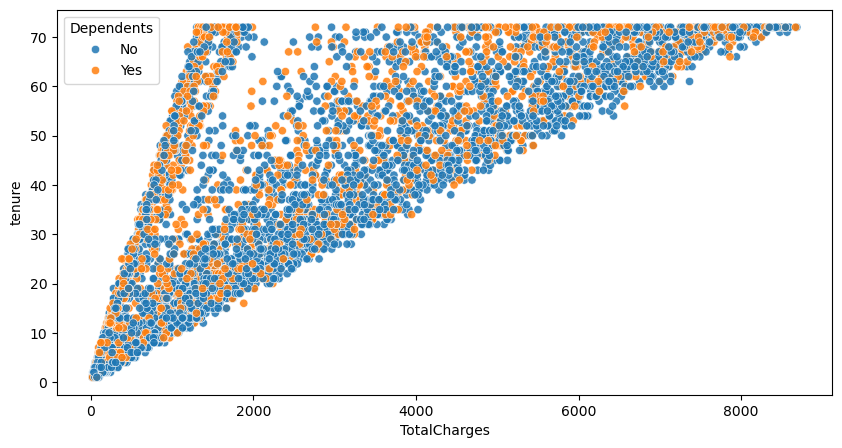

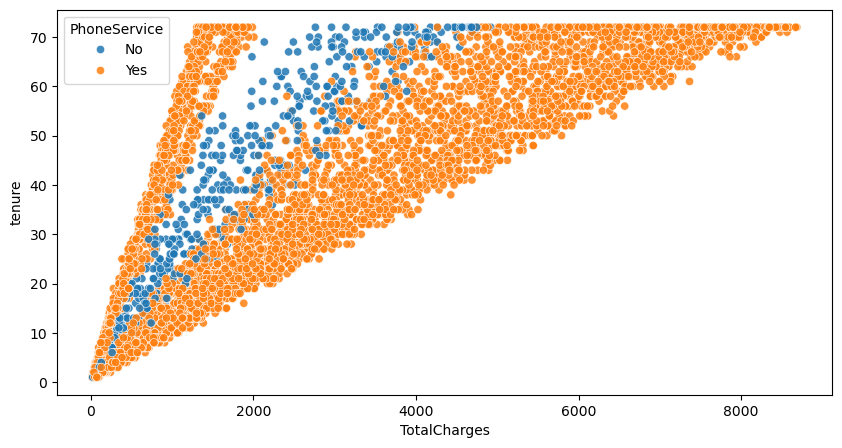

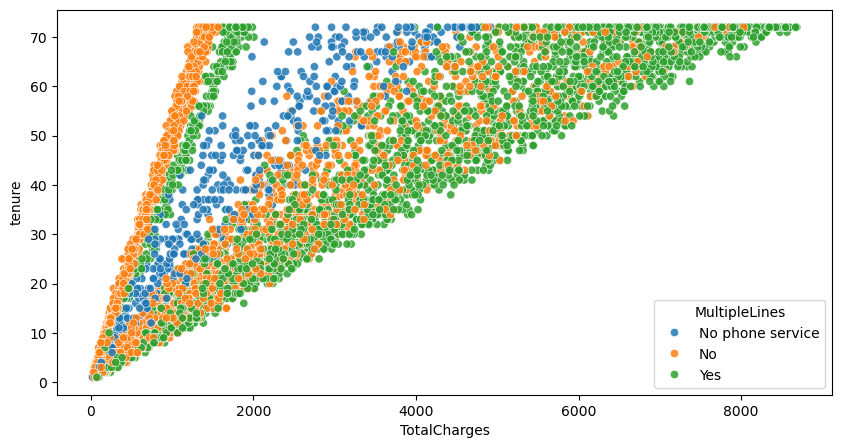

...

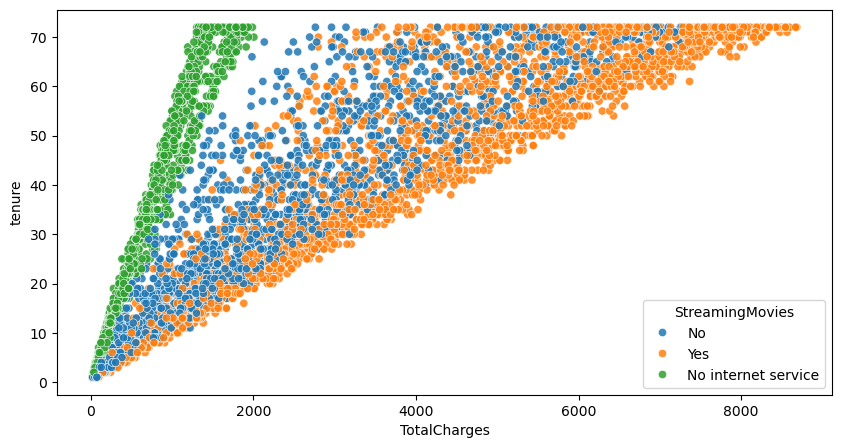

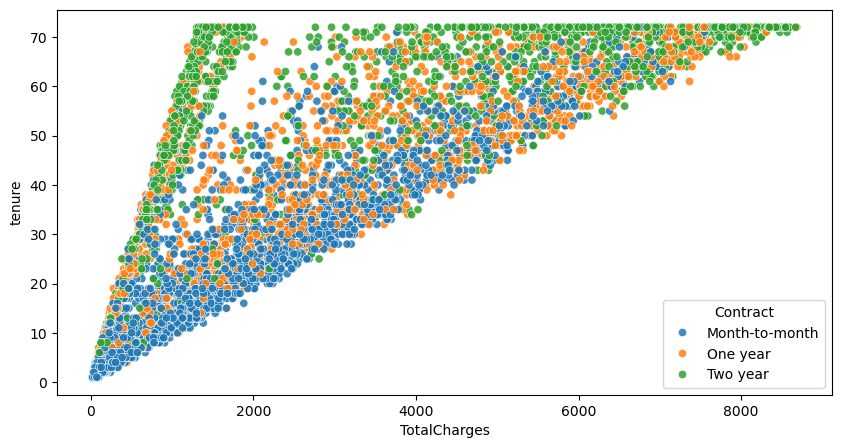

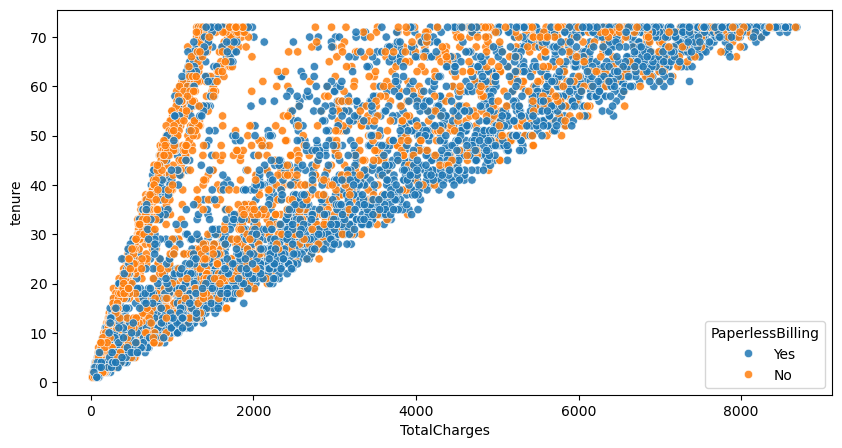

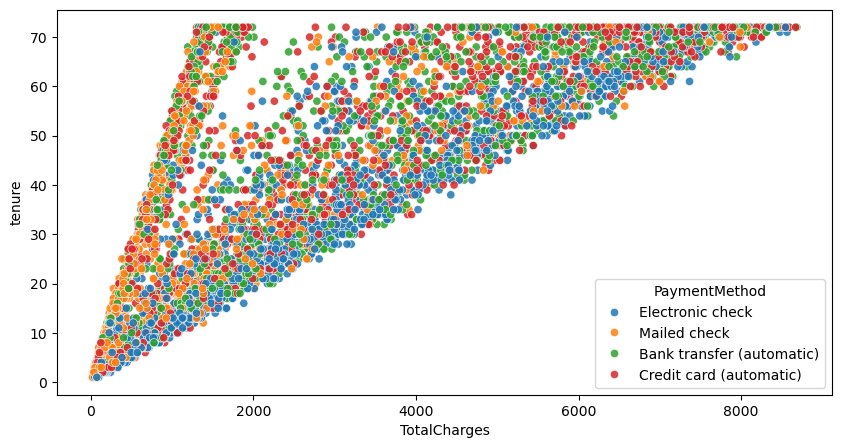

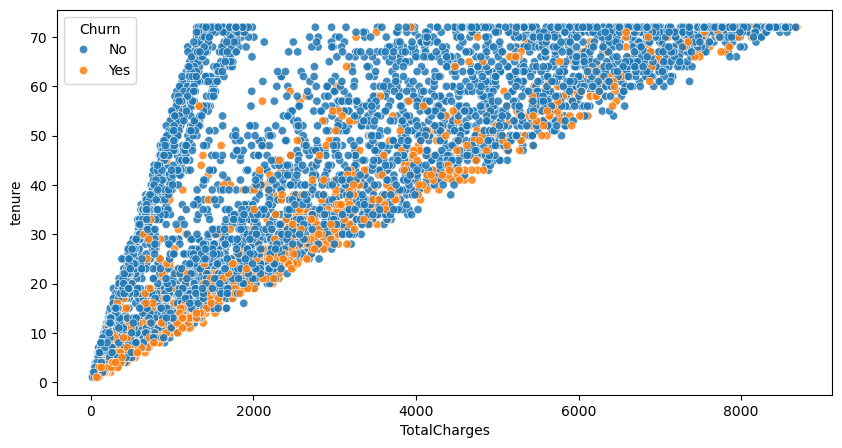

In [28]:
for cat in cat_col:
    bivariate_scatter('TotalCharges', 'tenure', cat, df)

## Correlation

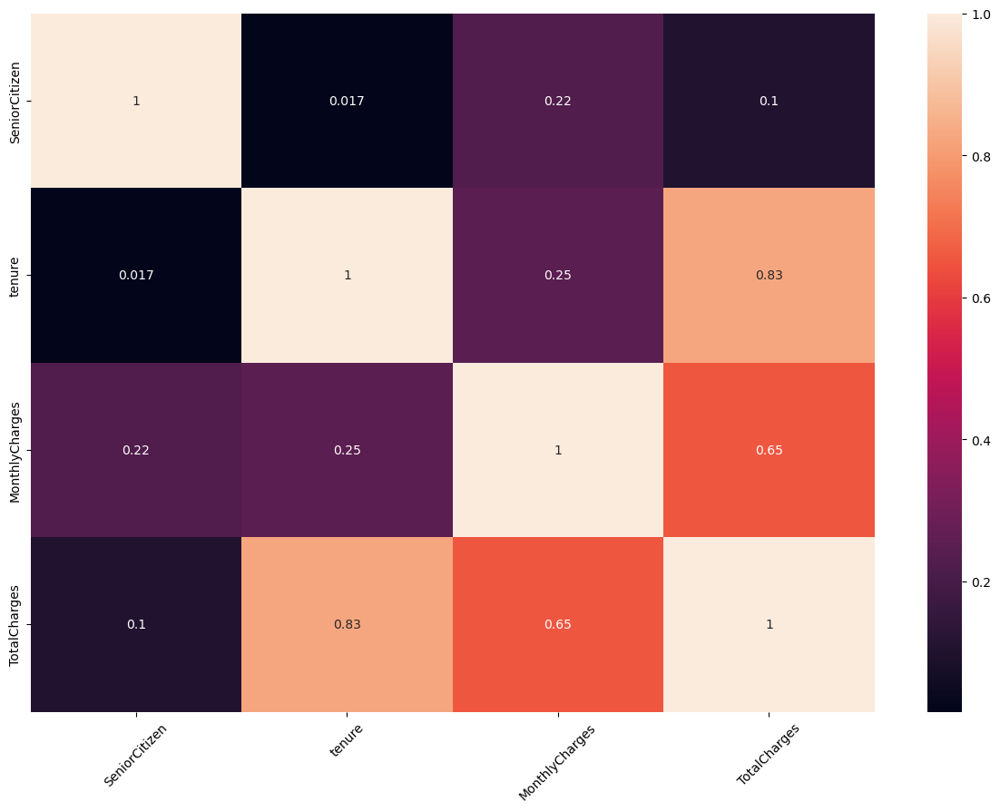

In [30]:
plt.figure(figsize = (15, 10))
sns.heatmap(df[num_col].corr(), annot = True)
plt.xticks(rotation=45)
plt.show()

## Outlier

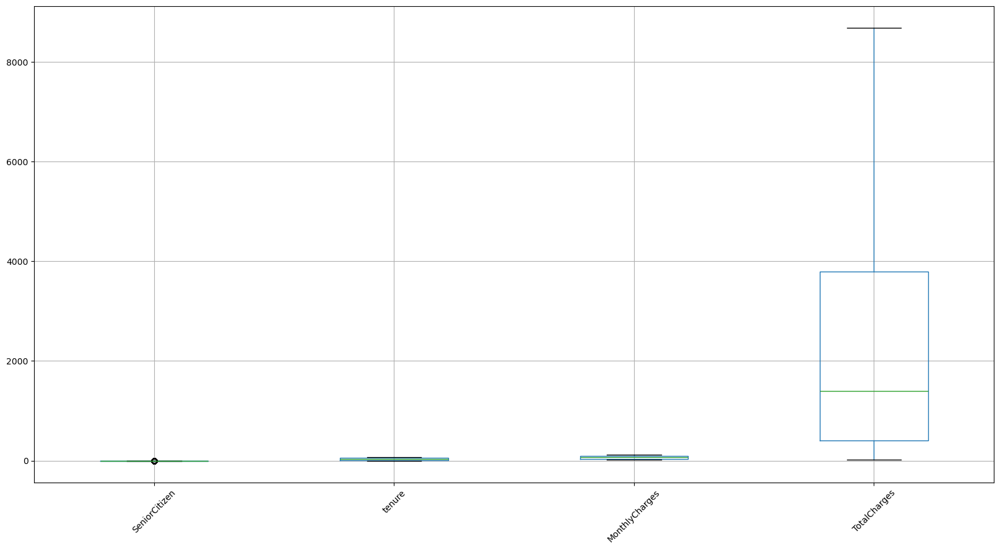

In [32]:
df.boxplot(figsize=(20, 10))
plt.xticks(rotation=45)
plt.show()

# Data Pre-processing

In [34]:
df_cp = df.copy()
df_cp.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


## Handling Missing Value

In [36]:
df_cp['TotalCharges'].mean()

2283.3004408418656

In [37]:
df_cp['TotalCharges'].fillna(df_cp['TotalCharges'].mean(), inplace=True)

In [38]:
df_cp.isnull().sum()

gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

## Handling Duplicated Value

In [40]:
df_cp.duplicated().sum()

22

In [41]:
df_cp.drop_duplicates(inplace=True)
df_cp.duplicated().sum()

0

## Splitting Data

In [43]:
X = df_cp.drop(columns = 'Churn')
y = df_cp['Churn']

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, test_size = 0.3, random_state = 42)

print("Dimension of X_train dataset:", X_train.shape)
print("Dimension of y_train dataset:", y_train.shape)
print("Dimension of X_test dataset:", X_test.shape)
print("Dimension of y_test dataset:", y_test.shape)

Dimension of X_train dataset: (4914, 19)
Dimension of y_train dataset: (4914,)
Dimension of X_test dataset: (2107, 19)
Dimension of y_test dataset: (2107,)


## Label Encoding

In [45]:
X_train.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
817,Female,0,Yes,Yes,55,Yes,No,Fiber optic,No,Yes,Yes,Yes,Yes,Yes,One year,Yes,Bank transfer (automatic),103.70,5656.75
1795,Female,0,Yes,No,19,Yes,Yes,Fiber optic,No,No,Yes,No,No,Yes,Month-to-month,No,Mailed check,89.65,1761.05
5233,Female,0,Yes,No,8,Yes,No,Fiber optic,No,Yes,Yes,No,Yes,Yes,Month-to-month,No,Electronic check,101.15,842.90
1017,Female,0,No,No,64,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,One year,Yes,Bank transfer (automatic),24.40,1601.20
4491,Male,0,No,No,1,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Month-to-month,Yes,Credit card (automatic),19.75,19.75


In [46]:
encoding_col = X_train.select_dtypes(include='object').columns
encoding_col

Index(['gender', 'Partner', 'Dependents', 'PhoneService', 'MultipleLines',
       'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
       'TechSupport', 'StreamingTV', 'StreamingMovies', 'Contract',
       'PaperlessBilling', 'PaymentMethod'],
      dtype='object')

In [47]:
encoders = {} # To store encoder objects for encoded columns
le_count = 0

for col in encoding_col:
    if X_train[col].nunique() <= 2:
        print(col)
        
        le = LabelEncoder()

        X_train[col] = le.fit_transform(X_train[col])
        X_test[col] = le.transform(X_test[col])

        encoders[col] = le
        le_count += 1

print('{} columns were label encoded.'.format(le_count))

gender
Partner
Dependents
PhoneService
PaperlessBilling
5 columns were label encoded.


In [48]:
X_train.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
817,0,0,1,1,55,1,No,Fiber optic,No,Yes,Yes,Yes,Yes,Yes,One year,1,Bank transfer (automatic),103.70,5656.75
1795,0,0,1,0,19,1,Yes,Fiber optic,No,No,Yes,No,No,Yes,Month-to-month,0,Mailed check,89.65,1761.05
5233,0,0,1,0,8,1,No,Fiber optic,No,Yes,Yes,No,Yes,Yes,Month-to-month,0,Electronic check,101.15,842.90
1017,0,0,0,0,64,1,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,One year,1,Bank transfer (automatic),24.40,1601.20
4491,1,0,0,0,1,1,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Month-to-month,1,Credit card (automatic),19.75,19.75


In [49]:
X_train.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
817,0,0,1,1,55,1,No,Fiber optic,No,Yes,Yes,Yes,Yes,Yes,One year,1,Bank transfer (automatic),103.70,5656.75
1795,0,0,1,0,19,1,Yes,Fiber optic,No,No,Yes,No,No,Yes,Month-to-month,0,Mailed check,89.65,1761.05
5233,0,0,1,0,8,1,No,Fiber optic,No,Yes,Yes,No,Yes,Yes,Month-to-month,0,Electronic check,101.15,842.90
1017,0,0,0,0,64,1,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,One year,1,Bank transfer (automatic),24.40,1601.20
4491,1,0,0,0,1,1,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Month-to-month,1,Credit card (automatic),19.75,19.75


In [50]:
pickle.dump(encoders, open('le.pkl', 'wb'))

## One Hot Encoding

In [52]:
X_train = pd.get_dummies(X_train)
X_test = pd.get_dummies(X_test)

In [53]:
train_cols = X_train.columns
test_cols = X_test.columns

missing_in_test = set(train_cols) - set(test_cols)
for c in missing_in_test:
    X_test[c] = 0

missing_in_train = set(test_cols) - set(train_cols)
for c in missing_in_train:
    X_train[c] = 0

X_test = X_test[train_cols]

In [54]:
X_train.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,MultipleLines_No,...,StreamingMovies_No,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
817,0,0,1,1,55,1,1,103.70,5656.75,True,...,False,False,True,False,True,False,True,False,False,False
1795,0,0,1,0,19,1,0,89.65,1761.05,False,...,False,False,True,True,False,False,False,False,False,True
5233,0,0,1,0,8,1,0,101.15,842.90,True,...,False,False,True,True,False,False,False,False,True,False
1017,0,0,0,0,64,1,1,24.40,1601.20,False,...,False,True,False,False,True,False,True,False,False,False
4491,1,0,0,0,1,1,1,19.75,19.75,True,...,False,True,False,True,False,False,False,True,False,False


In [55]:
X_test.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,MultipleLines_No,...,StreamingMovies_No,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
1750,0,0,0,0,50,1,1,89.7,4304.50,True,...,False,False,True,False,False,True,True,False,False,False
4153,1,0,0,0,27,1,0,20.3,595.05,True,...,False,True,False,False,True,False,False,False,False,True
5420,1,0,1,0,70,1,0,114.3,8244.30,False,...,False,False,True,False,False,True,False,True,False,False
7031,1,1,1,0,55,1,0,60.0,3316.10,False,...,True,False,False,False,True,False,False,True,False,False
6454,0,0,0,0,41,1,1,81.3,3190.65,False,...,True,False,False,True,False,False,False,True,False,False


In [56]:
X_train.columns

Index(['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure',
       'PhoneService', 'PaperlessBilling', 'MonthlyCharges', 'TotalCharges',
       'MultipleLines_No', 'MultipleLines_No phone service',
       'MultipleLines_Yes', 'InternetService_DSL',
       'InternetService_Fiber optic', 'InternetService_No',
       'OnlineSecurity_No', 'OnlineSecurity_No internet service',
       'OnlineSecurity_Yes', 'OnlineBackup_No',
       'OnlineBackup_No internet service', 'OnlineBackup_Yes',
       'DeviceProtection_No', 'DeviceProtection_No internet service',
       'DeviceProtection_Yes', 'TechSupport_No',
       'TechSupport_No internet service', 'TechSupport_Yes', 'StreamingTV_No',
       'StreamingTV_No internet service', 'StreamingTV_Yes',
       'StreamingMovies_No', 'StreamingMovies_No internet service',
       'StreamingMovies_Yes', 'Contract_Month-to-month', 'Contract_One year',
       'Contract_Two year', 'PaymentMethod_Bank transfer (automatic)',
       'PaymentMethod_Credit 

## Handling Imbalanced Dataset

In [58]:
label_counts = y_train.value_counts().sort_values(ascending=False)
label_counts

Churn
No     3614
Yes    1300
Name: count, dtype: int64

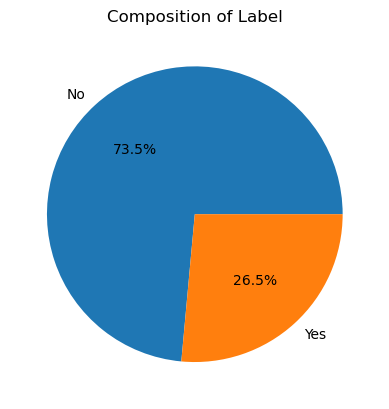

In [59]:
# create a pie chart
plt.pie(label_counts, labels=label_counts.index, autopct='%1.1f%%')

# add title
plt.title('Composition of Label')

# show the plot
plt.show()

Slightly unbalanced

In [61]:
smote = SMOTE(random_state=42)

X_train, y_train = smote.fit_resample(X_train, y_train)

print("Dimension of X_train dataset:", X_train.shape)
print("Dimension of y_train dataset:", y_train.shape)

Dimension of X_train dataset: (7228, 40)
Dimension of y_train dataset: (7228,)


In [62]:
feat_cols = X_train.columns

## Scaling Data

In [64]:
scaler = MinMaxScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_train_scaled

array([[0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 1.],
       [0., 0., 1., ..., 0., 1., 0.],
       ...,
       [1., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 1., 1., 0.],
       [0., 0., 0., ..., 0., 1., 0.]])

In [65]:
X_test_scaled

array([[0., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 1.],
       [1., 0., 1., ..., 1., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [1., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [66]:
pickle.dump(scaler, open('scaler.pkl', 'wb'))

# Modelling

## Preparing

In [69]:
def classification_eval(actual, predict, name):

  cm = confusion_matrix(actual, predict)
  # plot confusion matrix
  plt.figure(figsize=(8,6))
  sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False,
              xticklabels=['Not Churn', 'Churn'],
              yticklabels=['Not Churn', 'Churn'])
  plt.xlabel('Predicted Labels')
  plt.ylabel('Actual Lables')
  plt.title(f'Confusion Matrix - {name}')
  plt.show()

  print(classification_report(actual, predict))

In [70]:
y_train = y_train.map({'Yes': 1, 'No': 0})
y_test = y_test.map({'Yes': 1, 'No': 0})

In [71]:
y_train.head()

0    0
1    1
2    1
3    0
4    0
Name: Churn, dtype: int64

In [72]:
y_test.head()

1750    0
4153    0
5420    0
7031    0
6454    0
Name: Churn, dtype: int64

## Selecting Classifier

In [74]:
models = {
    'Gaussian NB': GaussianNB(),
    'Multinomial NB': MultinomialNB(),
    'Bernoulli NB': BernoulliNB(),
    'Logistic Regression': LogisticRegression(random_state=42),
    'SGD Classifier': SGDClassifier(random_state=42),
    'K-NN': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'Support Vector Machine': SVC(random_state=42),
    'Gaussian Process': GaussianProcessClassifier(random_state=42),
    'Bagging Classifier': BaggingClassifier(random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Ada Boost Classifier': AdaBoostClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42)
}

results = []

for model_name, model in models.items():
    model.fit(X_train_scaled, y_train)

    y_pred_train = model.predict(X_train_scaled)
    y_pred_test = model.predict(X_test_scaled)

    accuracy_train = accuracy_score(y_train, y_pred_train)
    accuracy_test = accuracy_score(y_test, y_pred_test)

    precision_train = precision_score(y_train, y_pred_train)
    precision_test = precision_score(y_test, y_pred_test)

    recall_train = recall_score(y_train, y_pred_train)
    recall_test = recall_score(y_test, y_pred_test)

    f1_train = f1_score(y_train, y_pred_train)
    f1_test = f1_score(y_test, y_pred_test)

    fbeta_train = fbeta_score(y_train, y_pred_train, beta=2.0)
    fbeta_test = fbeta_score(y_test, y_pred_test, beta=2.0)

    roc_auc_train = roc_auc_score(y_train, y_pred_train)
    roc_auc_test = roc_auc_score(y_test, y_pred_test)

    results.append({'Model': model_name, 'Test Recall': recall_test, 'Test Precision': precision_test, 'Test Accuracy': accuracy_test, 'Test F-1': f1_test, 'Test F-beta': fbeta_test, 'Test ROC-AUC': roc_auc_test})

df_accuracy = pd.DataFrame(results).sort_values(by=['Test Recall', 'Test Precision', 'Test Accuracy', 'Test F-1', 'Test F-beta', 'Test ROC-AUC'], ascending=[False, False, False, False, False, False])
df_accuracy

,Model,Test Recall,Test Precision,Test Accuracy,Test F-1,Test F-beta,Test ROC-AUC
1,Multinomial NB,0.870736,0.449074,0.683436,0.592547,0.733071,0.743433
0,Gaussian NB,0.845601,0.471000,0.708116,0.605010,0.729554,0.752156
2,Bernoulli NB,0.811490,0.468880,0.707167,0.594346,0.708020,0.740584
11,Ada Boost Classifier,0.646320,0.582524,0.784053,0.612766,0.632467,0.739934
3,Logistic Regression,0.612208,0.615523,0.796393,0.613861,0.612868,0.737394
12,Gradient Boosting,0.599641,0.612844,0.794020,0.606171,0.602236,0.731756
8,Gaussian Process,0.567325,0.600760,0.785952,0.583564,0.573711,0.715921
5,K-NN,0.549372,0.533101,0.753678,0.541114,0.546039,0.688234
4,SGD Classifier,0.547576,0.631470,0.795918,0.586538,0.562523,0.716369
7,Support Vector Machine,0.529623,0.621053,0.790223,0.571705,0.545690,0.706747


## Running Classifier

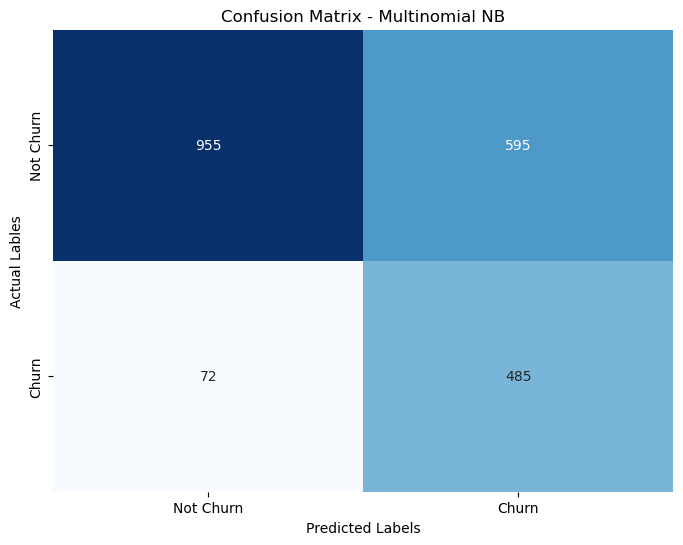

              precision    recall  f1-score   support

           0       0.93      0.62      0.74      1550
           1       0.45      0.87      0.59       557

    accuracy                           0.68      2107
   macro avg       0.69      0.74      0.67      2107
weighted avg       0.80      0.68      0.70      2107



In [76]:
mnb = MultinomialNB()

mnb.fit(X_train_scaled, y_train)
y_pred_test = mnb.predict(X_test_scaled)

classification_eval(y_test, y_pred_test, 'Multinomial NB')

## Threshold Tuning

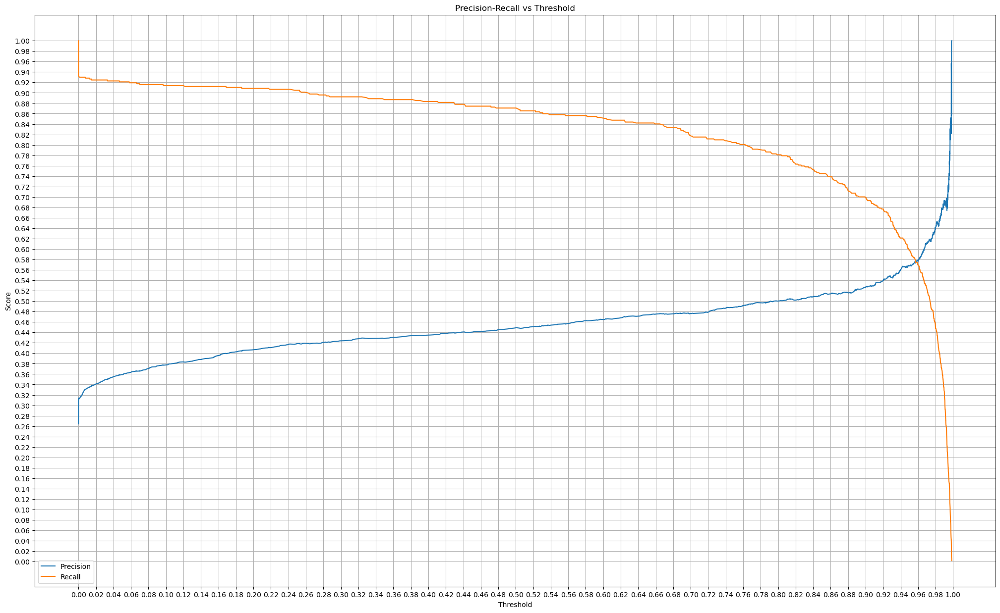

In [78]:
probs = mnb.predict_proba(X_test_scaled)[:, 1]

precision, recall, thresholds = precision_recall_curve(y_test, probs)

plt.figure(figsize = (25,15))
plt.plot(thresholds, precision[:-1], label='Precision')
plt.plot(thresholds, recall[:-1], label='Recall')
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.title('Precision-Recall vs Threshold')
plt.legend()
plt.xticks(np.arange(0, 1.02, 0.02))
plt.yticks(np.arange(0, 1.02, 0.02))
plt.grid(True)
plt.show()

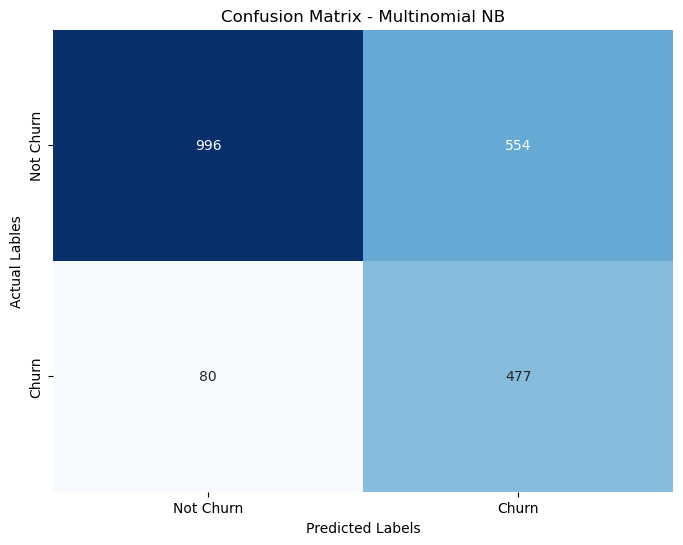

              precision    recall  f1-score   support

           0       0.93      0.64      0.76      1550
           1       0.46      0.86      0.60       557

    accuracy                           0.70      2107
   macro avg       0.69      0.75      0.68      2107
weighted avg       0.80      0.70      0.72      2107



In [79]:
new_threshold = 0.58

y_pred_test = (probs > new_threshold).astype(int)

classification_eval(y_test, y_pred_test, 'Multinomial NB')

In [80]:
pickle.dump(mnb, open('mnb.pkl', 'wb'))

# Feature Selection (Important)

## Numerical Features

In [83]:
num_col

Index(['SeniorCitizen', 'tenure', 'MonthlyCharges', 'TotalCharges'], dtype='object')

In [84]:
print("H0: Features NOT RELATED to Label")
print("H1: Features RELATED to Label\n")
print("-" * 60)

unique_label = df_cp['Churn'].unique()
related_num_features = []

for num in num_col:
    print(f"\nTesting {num} against Label:\n")
    
    groups = [df_cp[num][df_cp['Churn'] == value] for value in unique_label]
    
    f_statistic, p_value = f_oneway(*groups)
    
    print("F-statistic:", f_statistic)
    print("p-value:", p_value)
    
    alpha = 0.05
    if p_value < alpha:
        print("\nAccept H1: RELATED\n")
        related_num_features.append(num)
    else:
        print("\nAccept H0: NOT RELATED\n")

    print("-" * 60)

print("\nFeatures related to the Label:", related_num_features)

H0: Features NOT RELATED to Label
H1: Features RELATED to Label

------------------------------------------------------------

Testing SeniorCitizen against Label:

F-statistic: 165.15055400034973
p-value: 2.2328191178944197e-37

Accept H1: RELATED

------------------------------------------------------------

Testing tenure against Label:

F-statistic: 989.5150818926645
p-value: 2.6280951730468055e-203

Accept H1: RELATED

------------------------------------------------------------

Testing MonthlyCharges against Label:

F-statistic: 275.9933817648552
p-value: 8.041921866085037e-61

Accept H1: RELATED

------------------------------------------------------------

Testing TotalCharges against Label:

F-statistic: 287.31378845759474
p-value: 3.41718337753245e-63

Accept H1: RELATED

------------------------------------------------------------

Features related to the Label: ['SeniorCitizen', 'tenure', 'MonthlyCharges', 'TotalCharges']


In [85]:
unrelated_num_features = list(set(num_col) - set(related_num_features))

print("\nFeatures not related to the Label:", unrelated_num_features)


Features not related to the Label: []


## Categorical Features

In [87]:
cat_col

Index(['gender', 'Partner', 'Dependents', 'PhoneService', 'MultipleLines',
       'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
       'TechSupport', 'StreamingTV', 'StreamingMovies', 'Contract',
       'PaperlessBilling', 'PaymentMethod', 'Churn'],
      dtype='object')

In [88]:
cat_col = cat_col[cat_col != 'Churn']
cat_col

Index(['gender', 'Partner', 'Dependents', 'PhoneService', 'MultipleLines',
       'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
       'TechSupport', 'StreamingTV', 'StreamingMovies', 'Contract',
       'PaperlessBilling', 'PaymentMethod'],
      dtype='object')

In [89]:
print("H0: Features NOT RELATED to Label")
print("H1: Features RELATED to Label\n")
print("-" * 60)

related_cat_features = []

for cat in cat_col:
    print(f"\nTesting {cat} against Label:\n")

    contingency_table = pd.crosstab(df_cp[cat], df_cp['Churn'])
    
    chi2, p, dof, expected = chi2_contingency(contingency_table)

    print(f"Chi-square statistic: {chi2}")
    print(f"P-value: {p}")

    alpha = 0.05
    if p < alpha:
        print("\nAccept H1: RELATED\n")
        related_cat_features.append(cat)
    else:
        print("\nAccept H0: NOT RELATED\n")

    print("-" * 60)

print("\nFeatures related to the Label:", related_cat_features)

H0: Features NOT RELATED to Label
H1: Features RELATED to Label

------------------------------------------------------------

Testing gender against Label:

Chi-square statistic: 0.5000878161200975
P-value: 0.4794615390898278

Accept H0: NOT RELATED

------------------------------------------------------------

Testing Partner against Label:

Chi-square statistic: 155.47964557828
P-value: 1.0999615978939857e-35

Accept H1: RELATED

------------------------------------------------------------

Testing Dependents against Label:

Chi-square statistic: 186.78556926358303
P-value: 1.5995676694072134e-42

Accept H1: RELATED

------------------------------------------------------------

Testing PhoneService against Label:

Chi-square statistic: 0.8155175177999405
P-value: 0.3664940064978197

Accept H0: NOT RELATED

------------------------------------------------------------

Testing MultipleLines against Label:

Chi-square statistic: 12.361805177229707
P-value: 0.0020685599531309134

Accept

In [90]:
unrelated_cat_features = list(set(cat_col) - set(related_cat_features))

print("\nFeatures not related to the Label:", unrelated_cat_features)


Features not related to the Label: ['gender', 'PhoneService']


# New X_train and X_test

In [92]:
new_X_train = X_train.drop(columns=['gender', 'PhoneService'])
new_X_test = X_test.drop(columns=['gender', 'PhoneService'])

new_X_train.head()

,SeniorCitizen,Partner,Dependents,tenure,PaperlessBilling,MonthlyCharges,TotalCharges,MultipleLines_No,MultipleLines_No phone service,MultipleLines_Yes,...,StreamingMovies_No,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,0,1,1,55,1,103.70,5656.75,True,False,False,...,False,False,True,False,True,False,True,False,False,False
1,0,1,0,19,0,89.65,1761.05,False,False,True,...,False,False,True,True,False,False,False,False,False,True
2,0,1,0,8,0,101.15,842.90,True,False,False,...,False,False,True,True,False,False,False,False,True,False
3,0,0,0,64,1,24.40,1601.20,False,False,True,...,False,True,False,False,True,False,True,False,False,False
4,0,0,0,1,1,19.75,19.75,True,False,False,...,False,True,False,True,False,False,False,True,False,False


In [93]:
new_X_test.head()

,SeniorCitizen,Partner,Dependents,tenure,PaperlessBilling,MonthlyCharges,TotalCharges,MultipleLines_No,MultipleLines_No phone service,MultipleLines_Yes,...,StreamingMovies_No,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
1750,0,0,0,50,1,89.7,4304.50,True,False,False,...,False,False,True,False,False,True,True,False,False,False
4153,0,0,0,27,0,20.3,595.05,True,False,False,...,False,True,False,False,True,False,False,False,False,True
5420,0,1,0,70,0,114.3,8244.30,False,False,True,...,False,False,True,False,False,True,False,True,False,False
7031,1,1,0,55,0,60.0,3316.10,False,False,True,...,True,False,False,False,True,False,False,True,False,False
6454,0,0,0,41,1,81.3,3190.65,False,False,True,...,True,False,False,True,False,False,False,True,False,False


# Running Again the Code 

In [95]:
models = {
    'Gaussian NB': GaussianNB(),
    'Multinomial NB': MultinomialNB(),
    'Bernoulli NB': BernoulliNB(),
    'Logistic Regression': LogisticRegression(random_state=42),
    'K-NN': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'Gaussian Process': GaussianProcessClassifier(random_state=42),
    'Bagging Classifier': BaggingClassifier(random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Ada Boost Classifier': AdaBoostClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42)
}

new_scaler = MinMaxScaler()

new_X_train_scaled = new_scaler.fit_transform(new_X_train)
new_X_test_scaled = new_scaler.transform(new_X_test)

new_results = []

for model_name, model in models.items():
    model.fit(new_X_train_scaled, y_train)

    y_pred_train = model.predict(new_X_train_scaled)
    
    probs = model.predict_proba(new_X_test_scaled)[:, 1]
    y_pred_test = (probs > new_threshold).astype(int)

    accuracy_train = accuracy_score(y_train, y_pred_train)
    accuracy_test = accuracy_score(y_test, y_pred_test)

    precision_train = precision_score(y_train, y_pred_train)
    precision_test = precision_score(y_test, y_pred_test)

    recall_train = recall_score(y_train, y_pred_train)
    recall_test = recall_score(y_test, y_pred_test)

    f1_train = f1_score(y_train, y_pred_train)
    f1_test = f1_score(y_test, y_pred_test)

    fbeta_train = fbeta_score(y_train, y_pred_train, beta=2.0)
    fbeta_test = fbeta_score(y_test, y_pred_test, beta=2.0)

    roc_auc_train = roc_auc_score(y_train, y_pred_train)
    roc_auc_test = roc_auc_score(y_test, y_pred_test)

    new_results.append({'Model': model_name, 'Test Recall': recall_test, 'Test Precision': precision_test, 'Test Accuracy': accuracy_test, 'Test F-1': f1_test, 'Test F-beta': fbeta_test, 'Test ROC-AUC': roc_auc_test})

df_accuracy = pd.DataFrame(new_results).sort_values(by=['Test Recall', 'Test Precision', 'Test Accuracy', 'Test F-1', 'Test F-beta', 'Test ROC-AUC'], ascending=[False, False, False, False, False, False])
df_accuracy

,Model,Test Recall,Test Precision,Test Accuracy,Test F-1,Test F-beta,Test ROC-AUC
1,Multinomial NB,0.854578,0.458133,0.694352,0.596491,0.728497,0.745676
0,Gaussian NB,0.838420,0.469347,0.706692,0.601804,0.724480,0.748887
2,Bernoulli NB,0.806104,0.478168,0.716184,0.600267,0.708873,0.744988
4,K-NN,0.556553,0.542907,0.758899,0.549645,0.553769,0.694083
3,Logistic Regression,0.520646,0.679157,0.808258,0.589431,0.546139,0.716130
5,Decision Tree,0.509874,0.492201,0.731372,0.500882,0.506239,0.660421
10,Gradient Boosting,0.506284,0.643836,0.795444,0.566834,0.528882,0.702819
7,Bagging Classifier,0.484740,0.589520,0.774561,0.532020,0.502606,0.681725
6,Gaussian Process,0.447038,0.641753,0.787850,0.526984,0.475917,0.678680
8,Random Forest,0.445242,0.635897,0.785952,0.523759,0.473644,0.676815


# Running Again the Classifier 

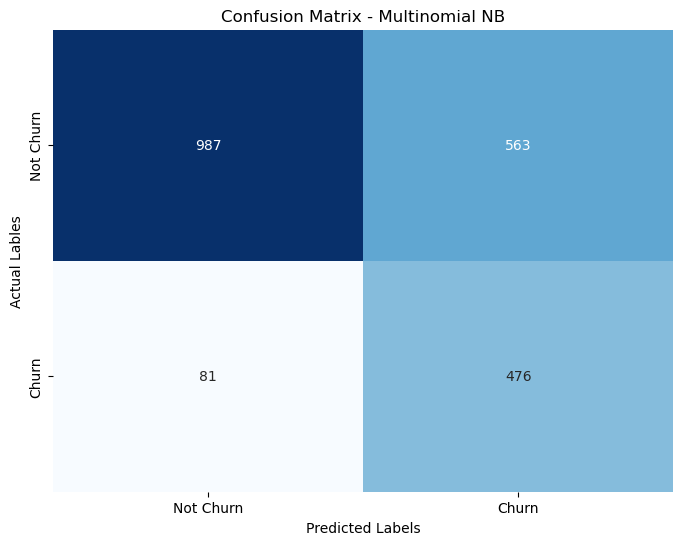

              precision    recall  f1-score   support

           0       0.92      0.64      0.75      1550
           1       0.46      0.85      0.60       557

    accuracy                           0.69      2107
   macro avg       0.69      0.75      0.68      2107
weighted avg       0.80      0.69      0.71      2107



In [97]:
mnb_2 = MultinomialNB()

mnb_2.fit(new_X_train_scaled, y_train)

probs = mnb_2.predict_proba(new_X_test_scaled)[:, 1]
y_pred_test = (probs > new_threshold).astype(int)

classification_eval(y_test, y_pred_test, 'Multinomial NB')